In [6]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Đọc dữ liệu đã được xử lý

In [7]:
df = pd.read_csv(r'../Data/processed/universities_processed.csv')
df.head(5)

,Institution Name,Region,Country,Overall,Academic Reputation,Employer Reputation,Faculty Student Ratio,Citations Per Faculty,International Faculty Ratio,International Students Ratio,International Research Network,Employment Outcomes,Sustainability
0,Massachusetts Institute of Technology (MIT),North America,United States,100.0,100.0,100.0,100.0,100.0,100.0,88.2,94.3,100.0,95.2
1,University of Cambridge,Europe,United Kingdom,99.2,100.0,100.0,100.0,92.3,100.0,95.8,99.9,100.0,97.3
2,University of Oxford,Europe,United Kingdom,98.9,100.0,100.0,100.0,90.6,98.2,98.2,100.0,100.0,97.8
3,Harvard University,North America,United States,98.3,100.0,100.0,98.3,100.0,84.6,66.8,100.0,100.0,96.7
4,Stanford University,North America,United States,98.1,100.0,100.0,100.0,99.9,99.9,51.2,95.8,100.0,94.4


# Khám phá dữ liệu

## I. Đặt câu hỏi và trả lời để khám phá dữ liệu

### I.1. Tìm kiếm các yếu tố ảnh hưởng tới Đầu ra việc làm của sinh viên theo học tại trường?

- Lợi ích: Giúp sinh viên chọn được trường đem lại Đầu ra việc làm cao nhất mà mình có thể vào được?
- Để tìm ra câu trả lời, ta vẽ biểu đồ scatter xem xét quan hệ của các cột dữ liệu hiện có trong bảng và cột Đầu ra việc làm. Nếu các điểm biểu diễn quan hệ tạo thành một hình dạng đường nào đó thì có thể cột đó có quan hệ với cột Đầu ra việc làm. 

In [8]:
# Các hàm dùng để vẽ các biểu đồ scatter
def draw_scatter_plot(X,Y,xlabel,ylabel,title,label):
    slope, intercept = np.polyfit(X, Y, 1)
    line = slope * X + intercept
    plt.figure(figsize=(8, 6))
    plt.scatter(X, Y, label=label)
    plt.plot(X, line, color='red', label='Regression Line')
    plt.xlabel(xlabel=xlabel,fontweight='bold')
    plt.ylabel(ylabel=ylabel,fontweight='bold')
    plt.title(label=title,fontweight='bold')
    plt.legend()
    plt.show()

def draw_scatter_plot_3D(X,Y,Z,xlable,ylable,zlabel,title,label):
    fig = plt.figure()
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(X,Y,Z,c='r',marker='o')
    ax.set_xlabel(xlabel= xlable,fontweight='bold')
    ax.set_ylabel(ylabel=ylable,fontweight='bold')
    ax.set_zlabel(zlabel=zlabel,fontweight='bold')
    ax.set_title(label=title,fontweight='bold')
    plt.show()


def draw_scatter_plot_for_all_columns(df: pd.DataFrame,column_name: str):
    for column in df.columns:
        if column != 'Institution Name' and \
        column != 'Region' and \
        column != 'Country' and \
        column != 'Overall' and \
        column != column_name:
            title = f"{column.upper()} AND {column_name.upper()}"
            draw_scatter_plot(df[column],df[column_name],column,column_name,title,title)

def draw_scatter_plot_3D_for_all_columns(df: pd.DataFrame, column_name: str):
    columns = df.columns
    n = len(columns)

    for i in range(4,n):
        if columns[i] != column_name:
            for j in range(i+1,n):
                if columns[j] != column_name:
                    title = f"{columns[i].upper()} AND {columns[j].upper()} AND {column_name.upper()}"
                    draw_scatter_plot_3D(df[columns[i]],df[columns[j]],df[column_name],columns[i],columns[j],column_name,title,title)


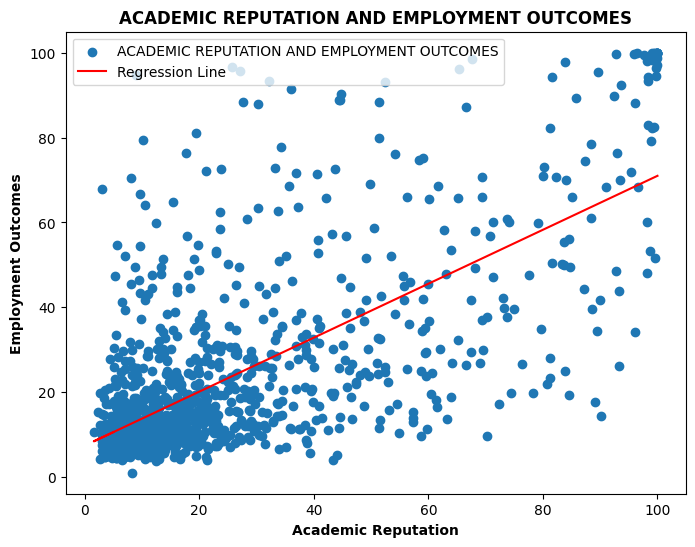

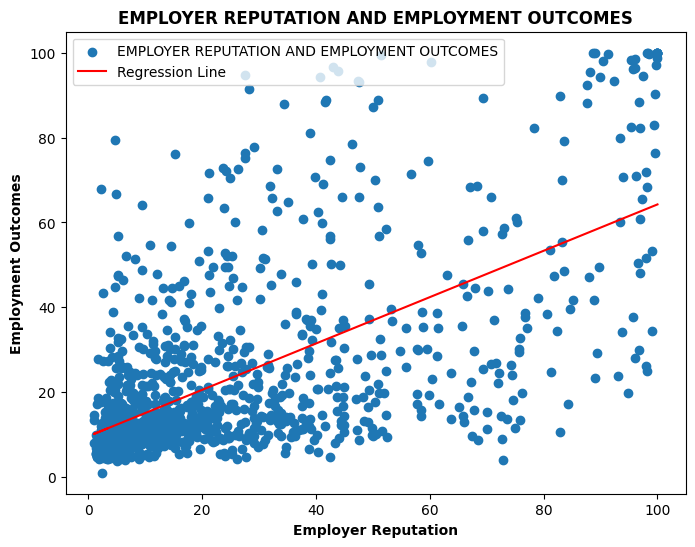

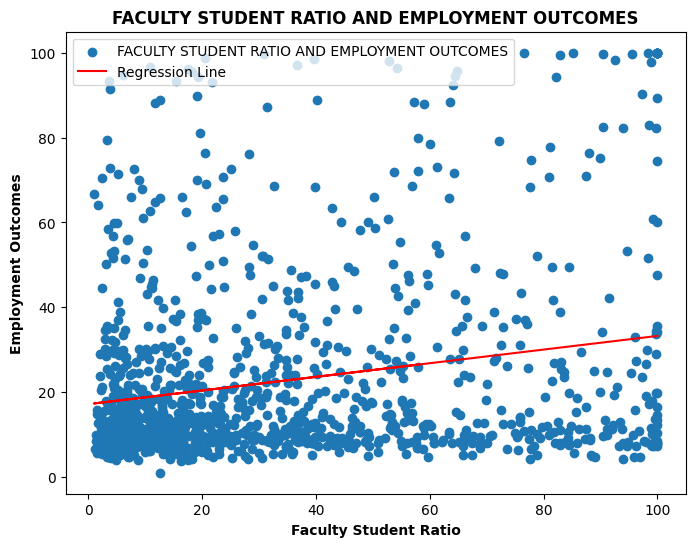

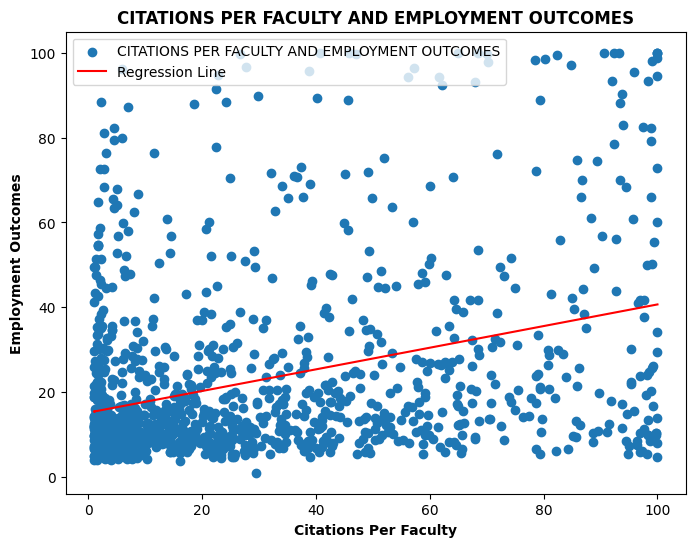

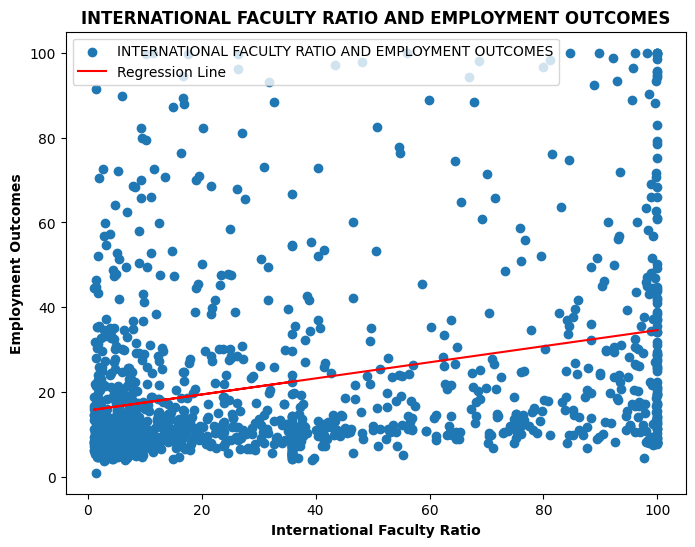

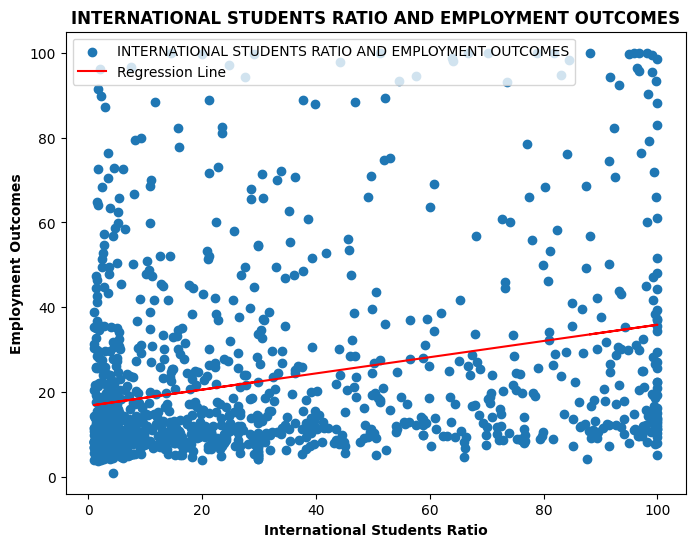

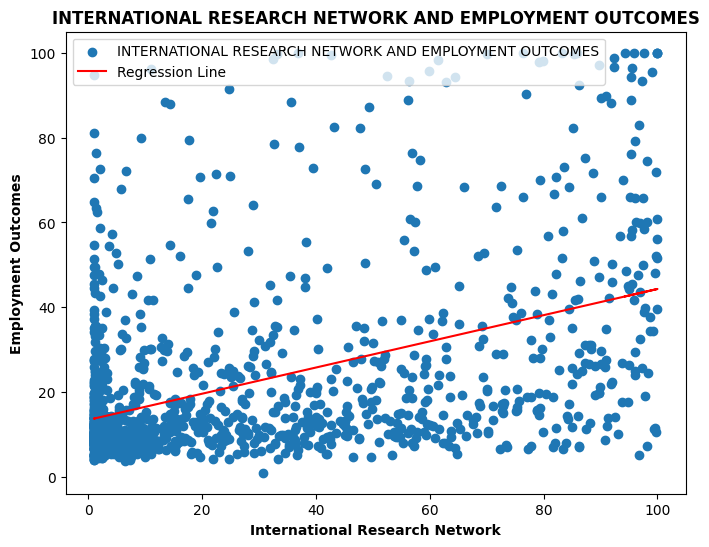

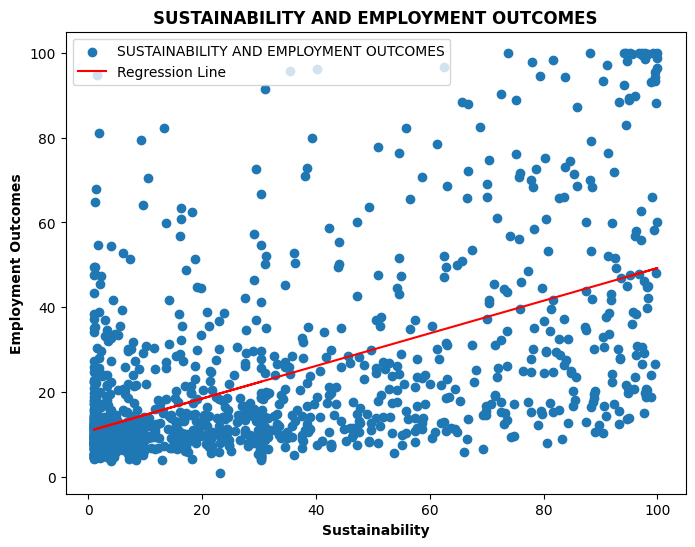

In [9]:
# Vẽ scatter trên mặt phẳng 2D
draw_scatter_plot_for_all_columns(df,'Employment Outcomes')

### Trả lời: 
- Ta thấy rằng các điểm biểu diễn mối quan hệ giữa cột Đầu ra việc làm và các cột còn lại dường như không phân bố theo quy luật nào cả.

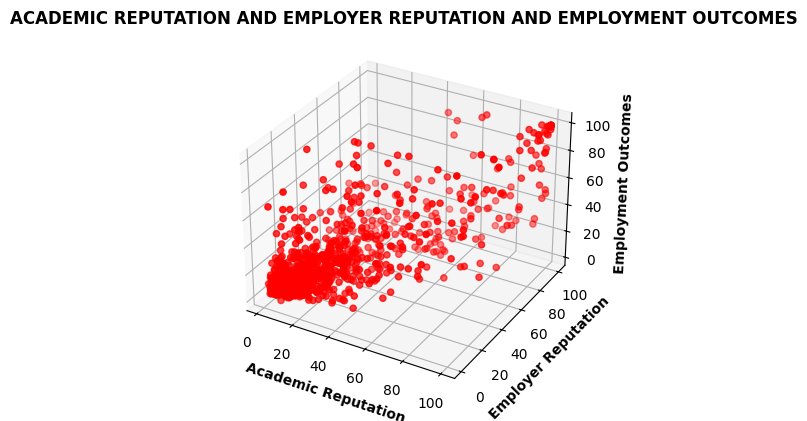

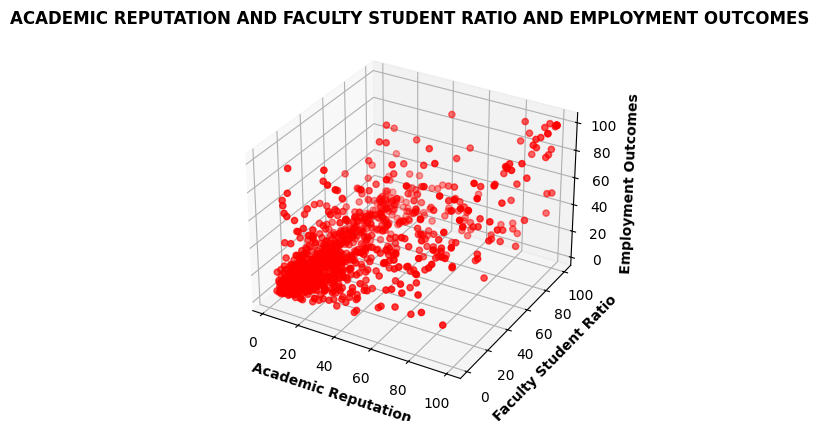

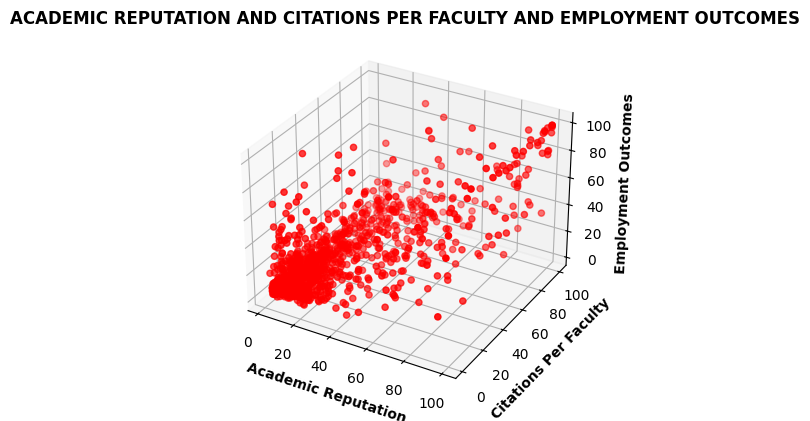

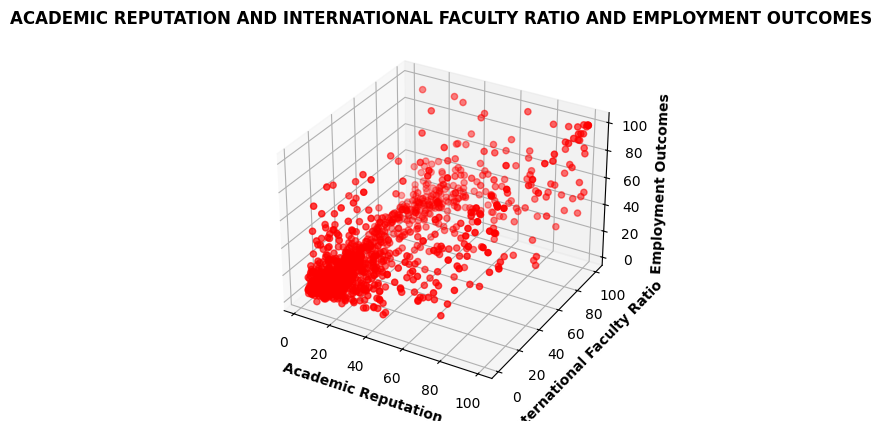

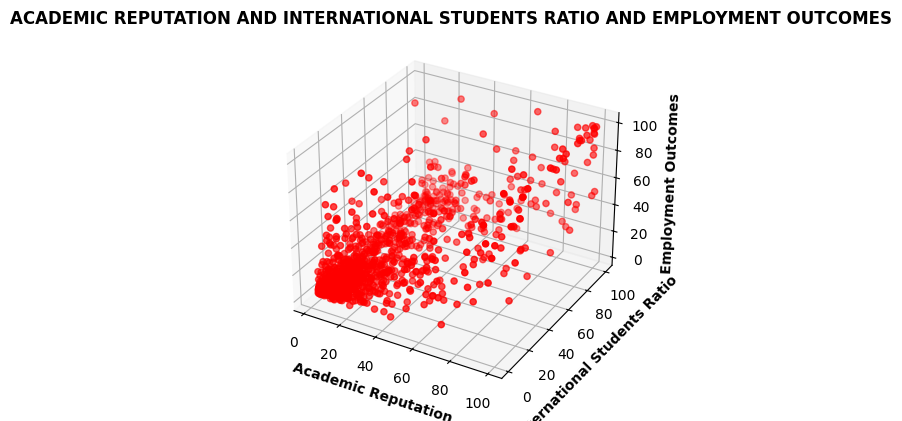

...

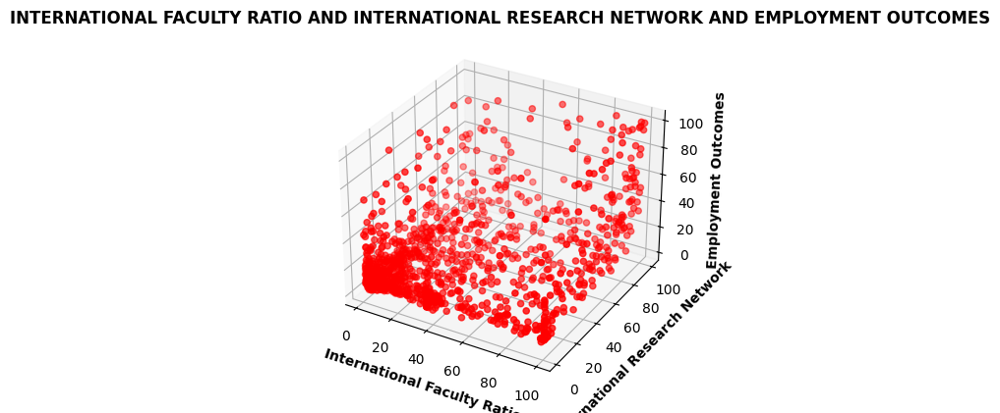

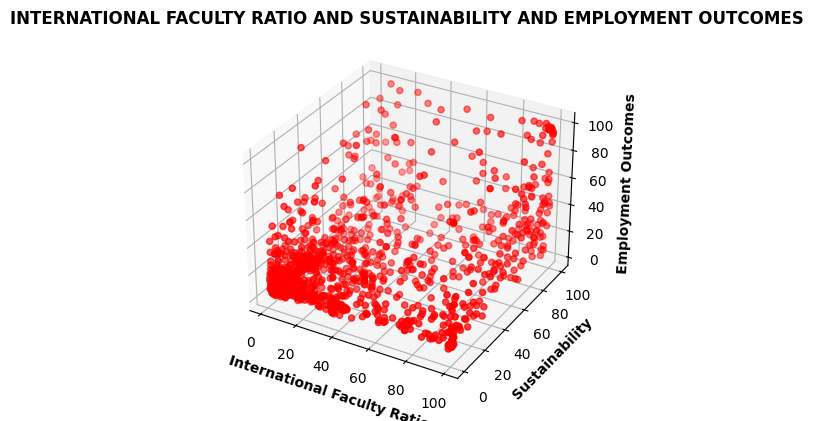

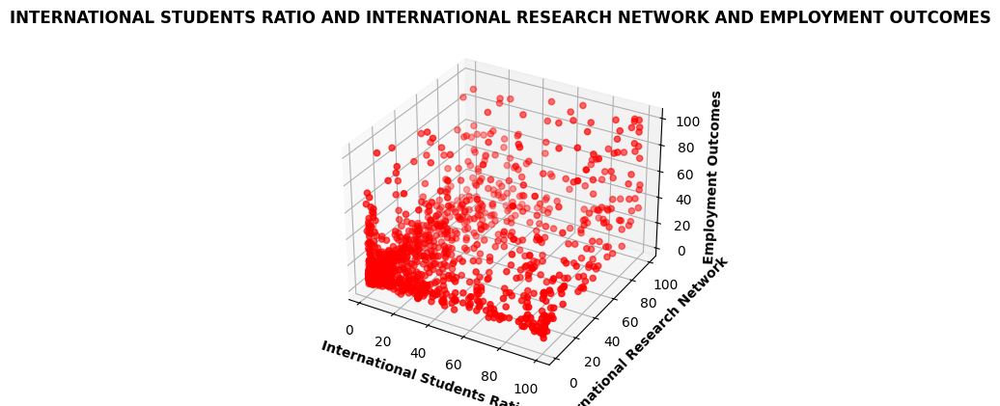

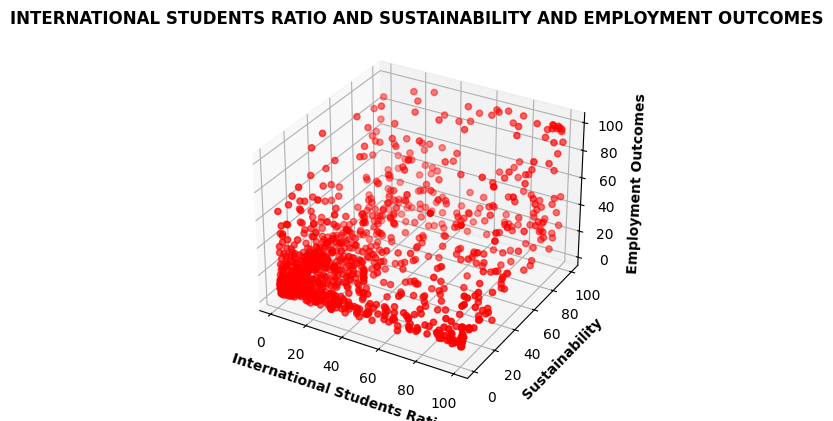

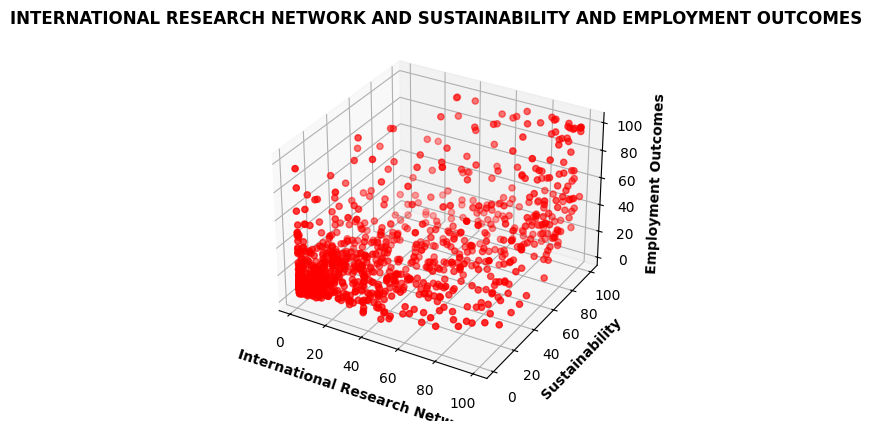

In [10]:
# Vẽ Scatter trong không gian 3 chiều
draw_scatter_plot_3D_for_all_columns(df,'Employment Outcomes')

### Trả lời:
- Ở các biểu đồ thể hiện quan hệ giữa ba thuộc tính Danh tiếng học thuật, Danh tiếng từ doanh nghiệp và Đầu ra việc làm, chúng ta đều thấy rằng mật độ các điểm ở gốc toạ độ luôn là rất dày đặc. Từ đó có thể đưa ra một dự đoán rằng, các sinh viên học tại trường ít danh tiếng thường ít đạt thành công trong đầu ra công việc.
- Mặt khác ở càng xa gốc toạ độ, ta thấy các điểm càng phân tán và chỉ tập trung tại điểm có toạ độ (100,100,100). Do vậy có thể đưa ra một dự đoán rằng, sinh viên học tại trường có càng nhiều danh tiếng về học thuật cũng như danh tiếng từ doanh nghiệp thì càng thành công về đầu ra công việc.
- Vậy có cơ sở để tin rằng, học trường càng danh tiếng thì càng có cơ hội thành công về đầu ra công việc. 

### Câu hỏi: Xem xét các yếu tố ảnh hưởng đến Tỷ lệ học sinh quốc tế theo học tại trường?
- Lợi ích: Xác định được các yếu tố ảnh hưởng đến Tỷ lệ học sinh quốc tế ở 1200 trường top đầu, các trường trong nhóm này có thể điều chỉnh một số hoạt động để thu hút sinh viên thuộc nhóm này.
- Để tìm câu trả lời cho câu hỏi trên, ta cần vẽ biểu đồ và quan sát xem các điểm biểu diễn các quan hệ có định hình nên một dạng đường gì đặc biệt hay không. Nếu có thì ta có thể dự đoán rằng, các cột khác trên biểu đồ đó có ảnh hưởng đến Tỷ lệ học sinh quốc tế theo học tại trường.

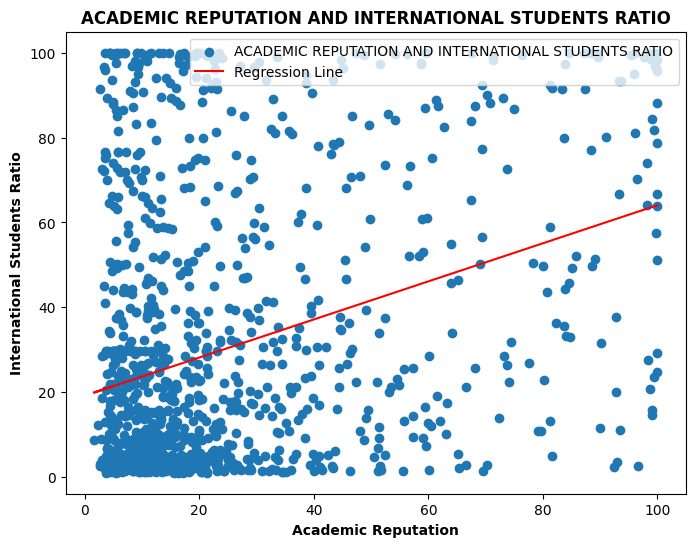

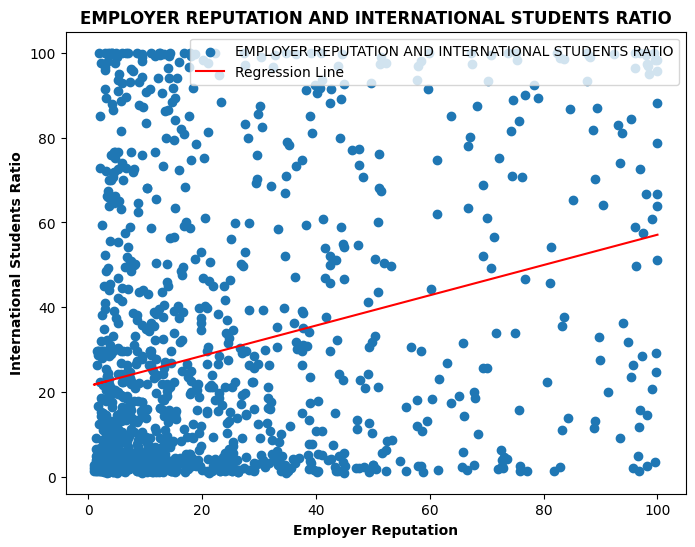

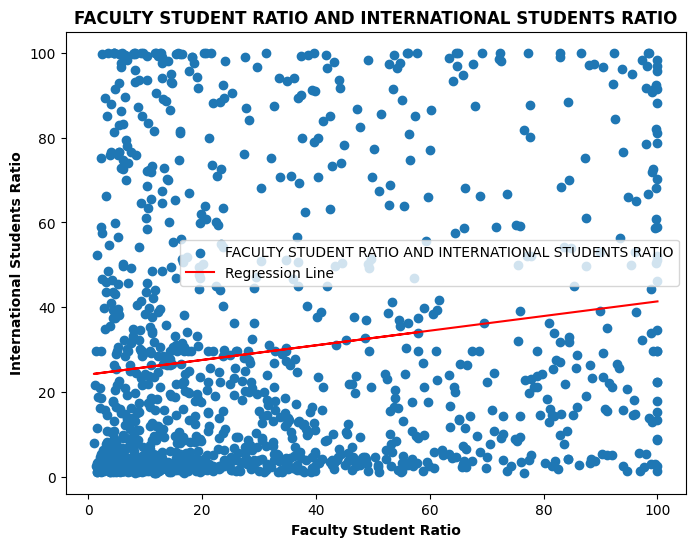

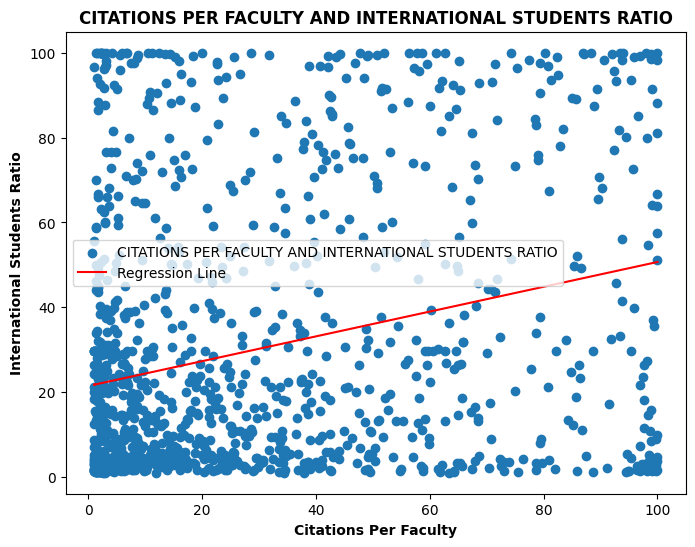

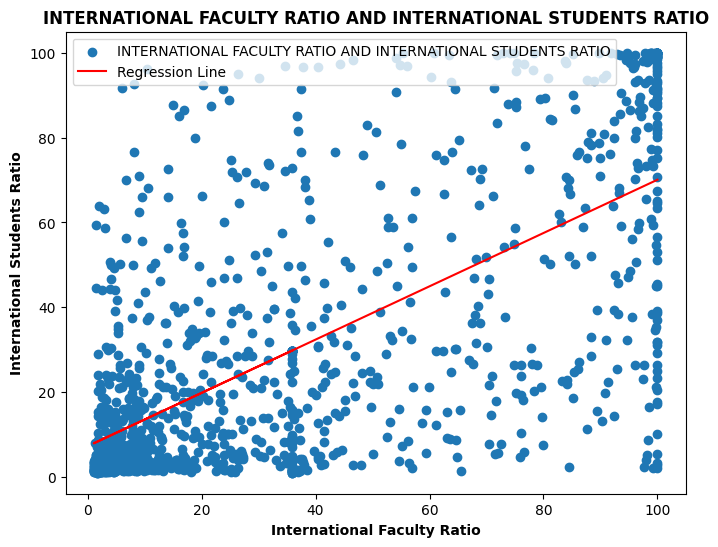

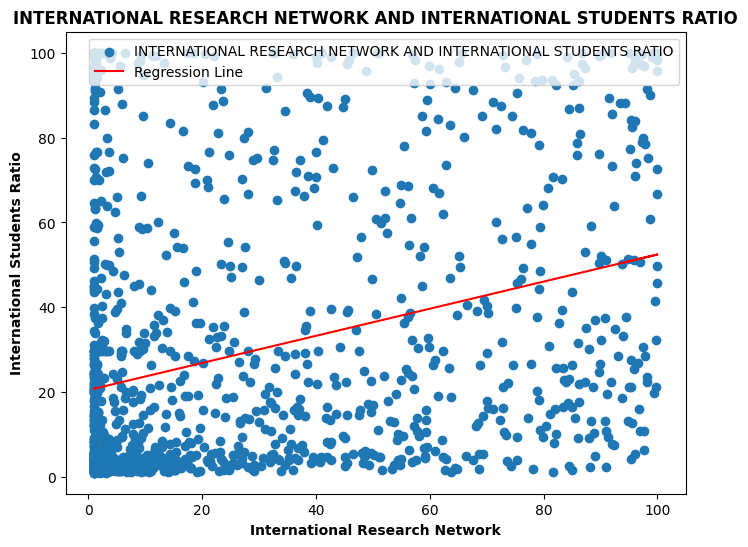

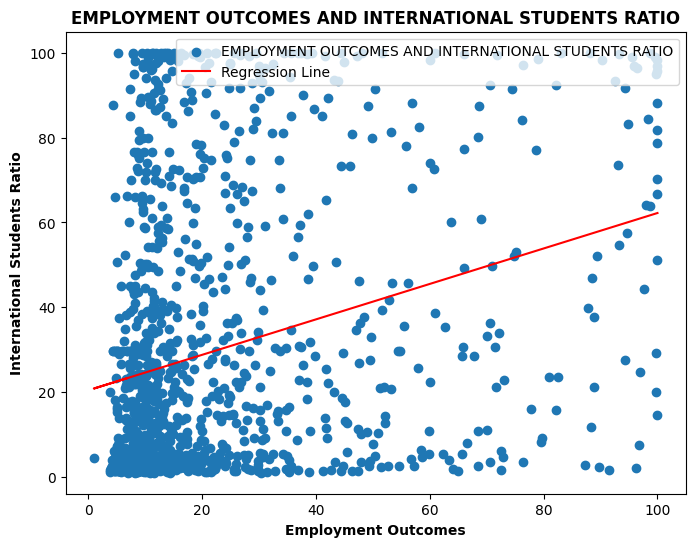

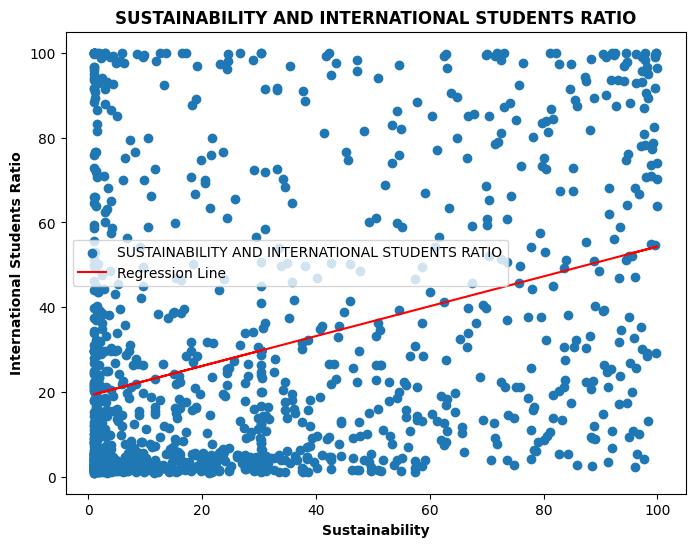

In [11]:
# Vẽ Scatter cho 2 cột
draw_scatter_plot_for_all_columns(df,'International Students Ratio')

### Trả lời:

- Các điểm biểu diễn quan hệ giữa hai cột đều phân bố rất hỗn loạn nên ta chưa thể đưa ra được dự đoán gì khi vẽ scatter cho hai cột.

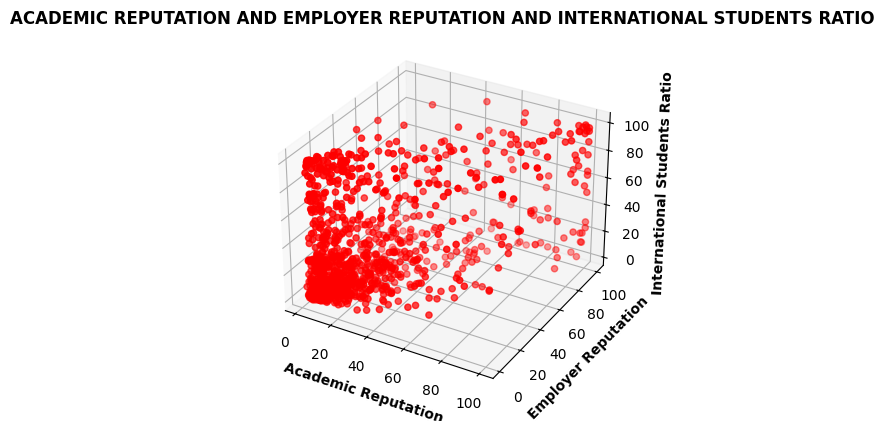

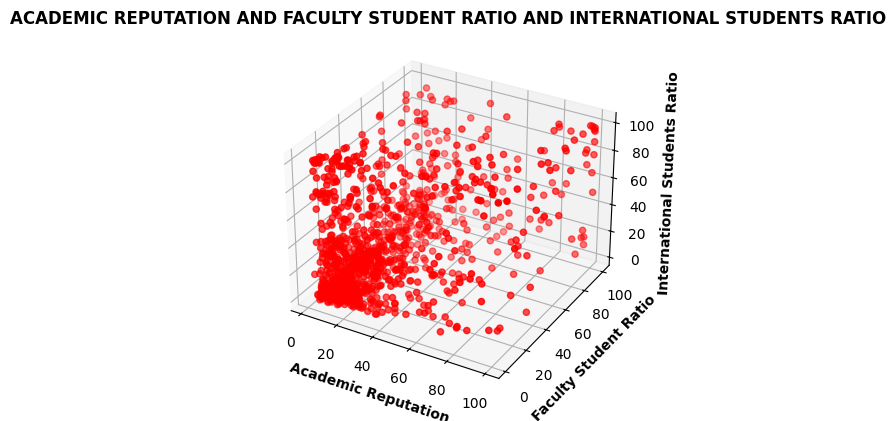

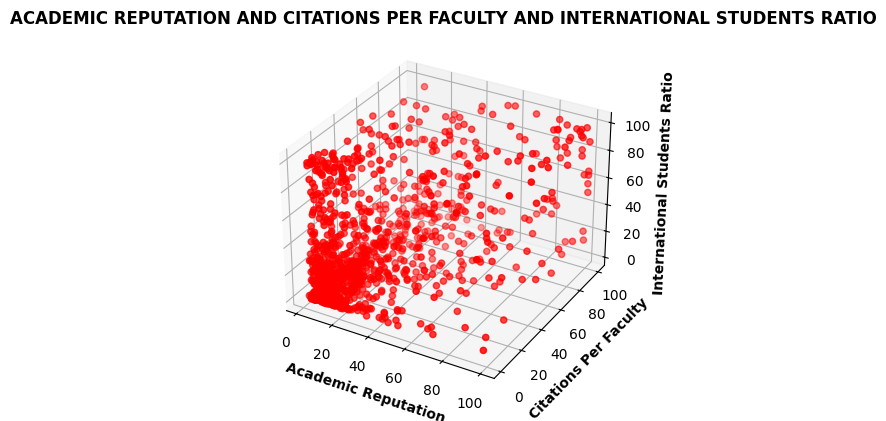

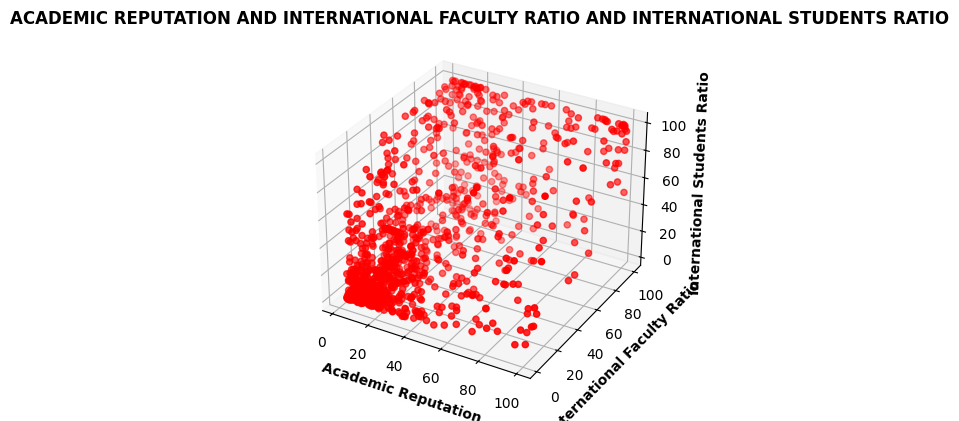

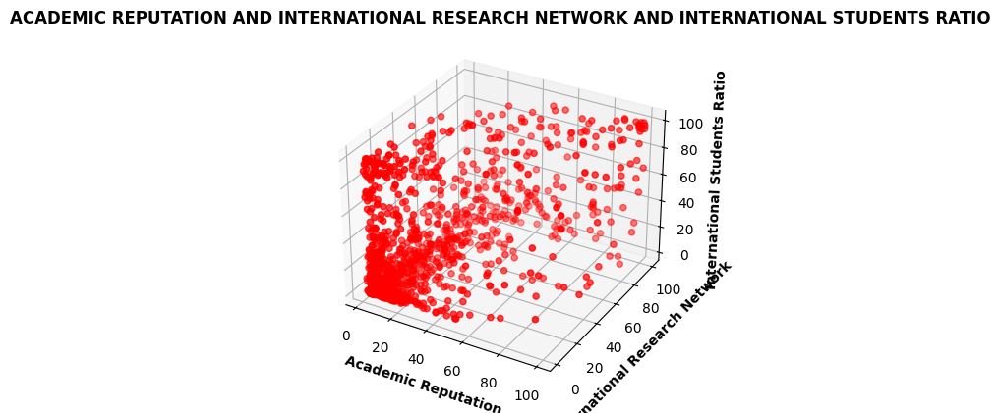

...

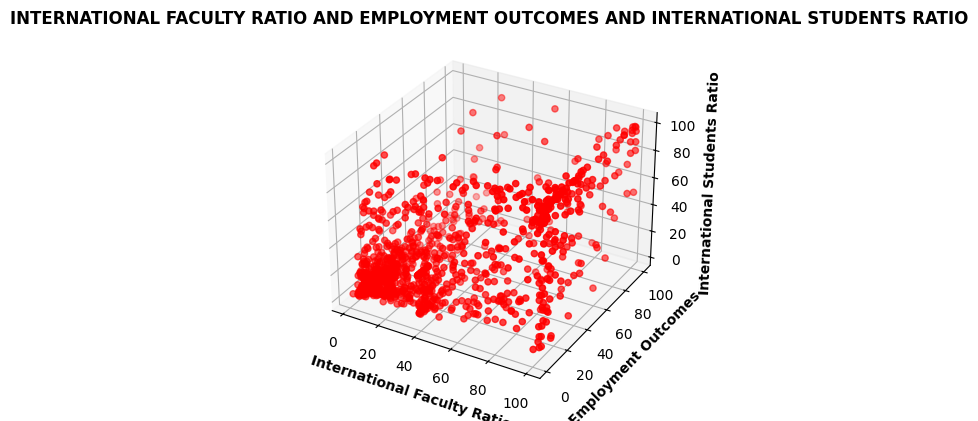

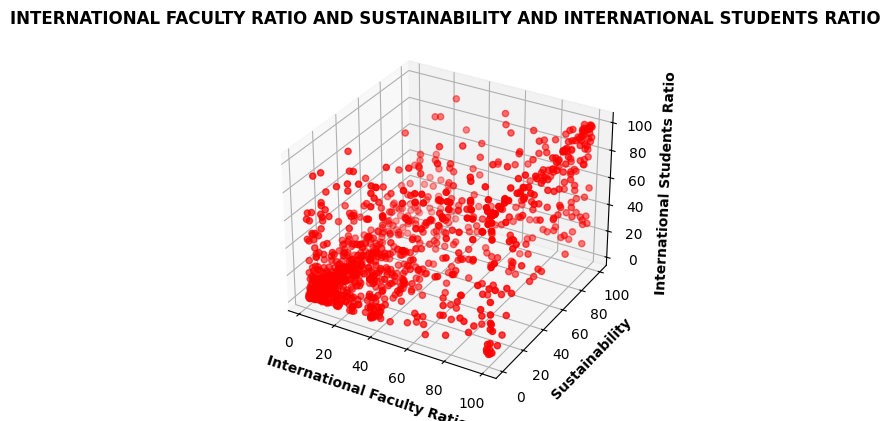

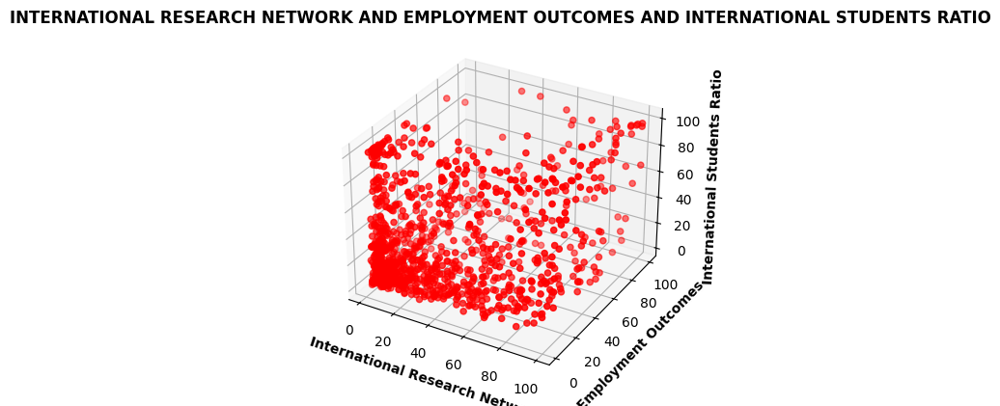

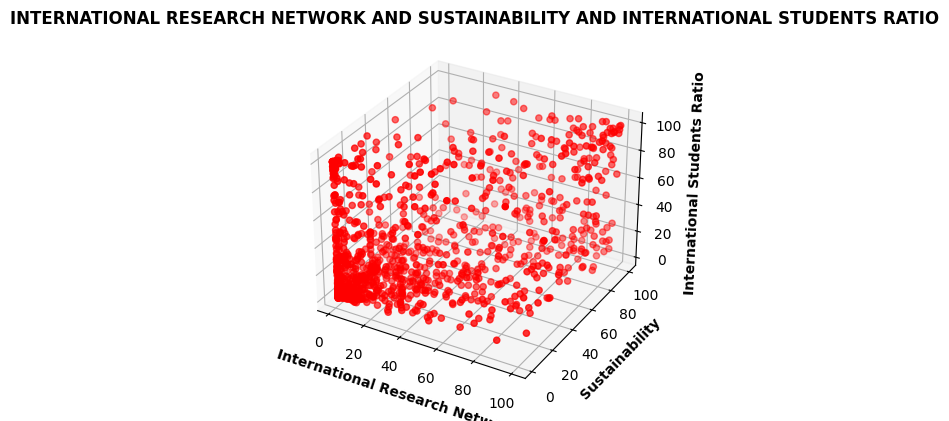

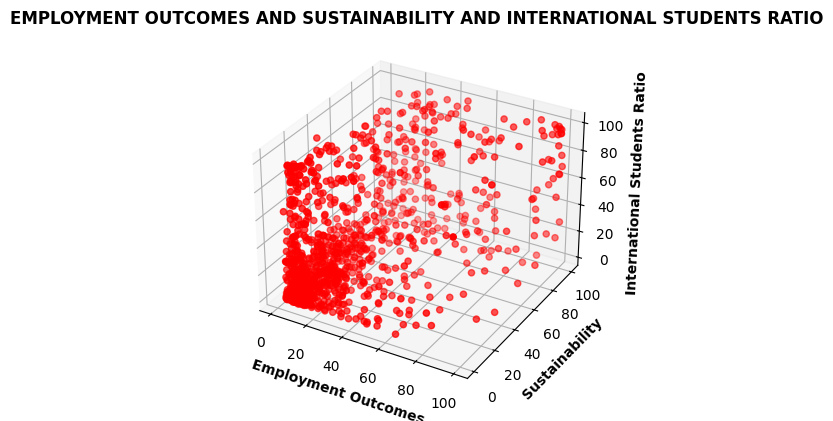

In [12]:
# Vẽ scatter cho không gian 3 chiều
draw_scatter_plot_3D_for_all_columns(df,'International Students Ratio')

### Trả lời:
- Trong hai biểu đồ thể hiện quan hệ Tỉ lệ giảng viên quốc tế, Mạng lưới nghiên cứu quốc tế, Tỉ lệ sinh viên quốc tế và Tỉ lệ giảng viên quốc tế, Mức độ cam kết, Tỉ lệ sinh viên quốc tế, ta thấy rằng các điểm biểu diễn mối quan hệ giữa 3 thuộc tính ở bên trong hình lập phương định ra một dạng đường nào đó. Do đó ta có thể suy đoán rằng, Tỉ lệ sinh viên quốc tế có thể chịu ảnh hưởng bởi các yếu tố này.

<Axes: >

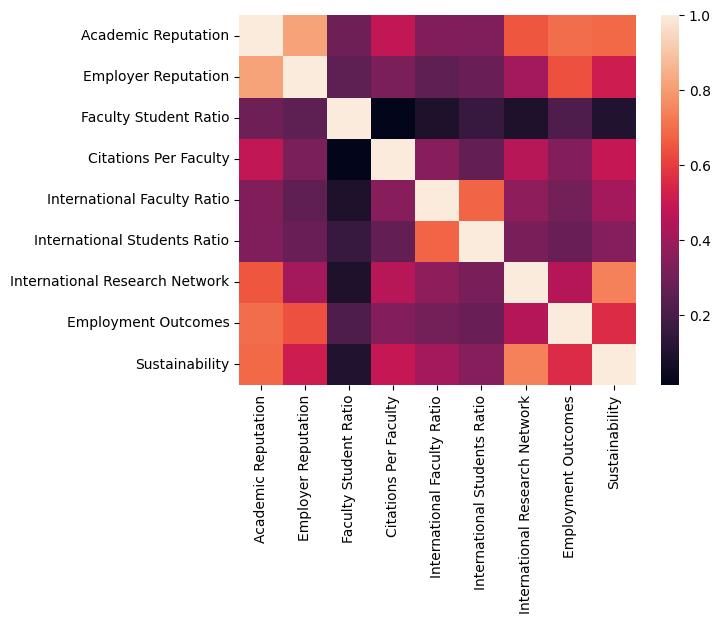

In [13]:
# Vẽ heatmap để xem xét quan hệ giữa hai cột có dữ liệu kiểu số bất kỳ
number_datas =  df.iloc[:,4:13]
sns.heatmap(number_datas.corr())

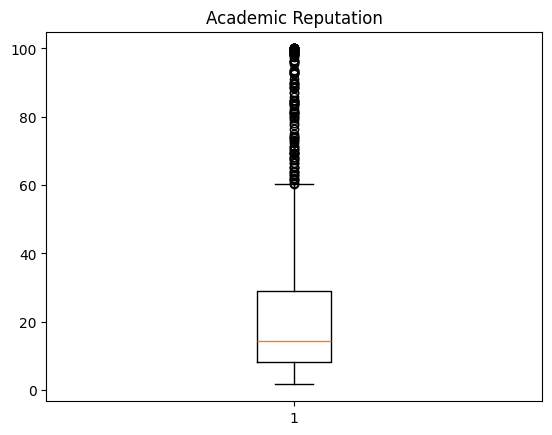

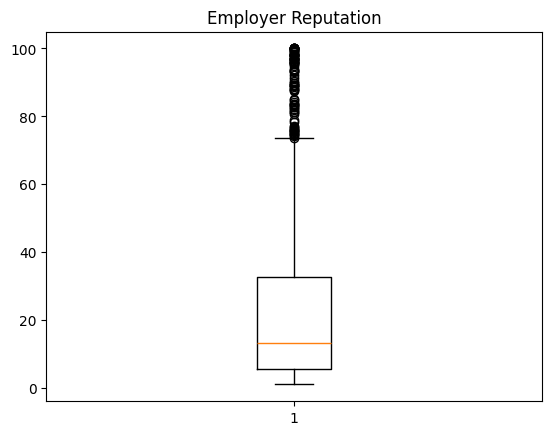

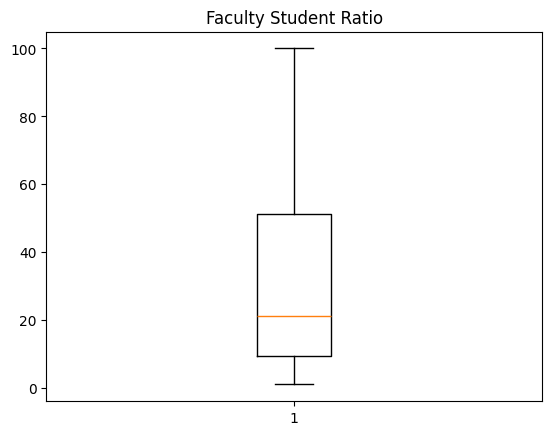

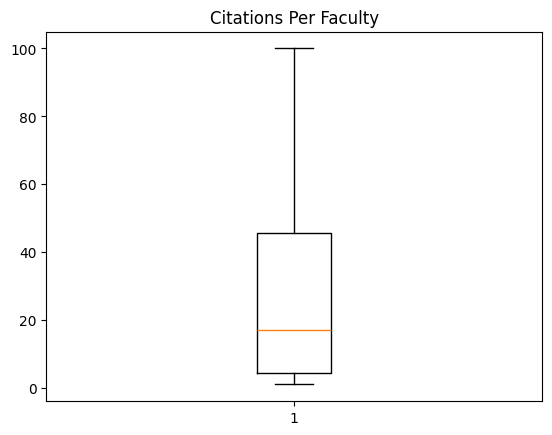

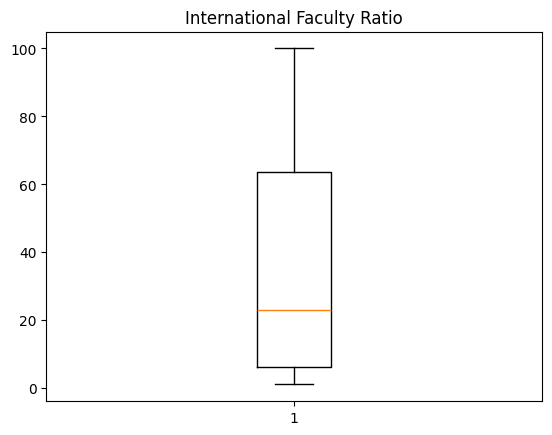

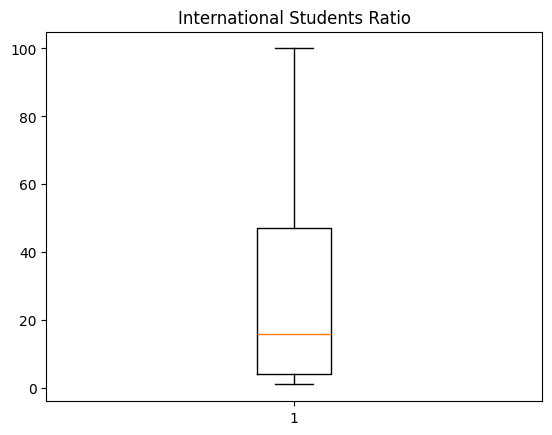

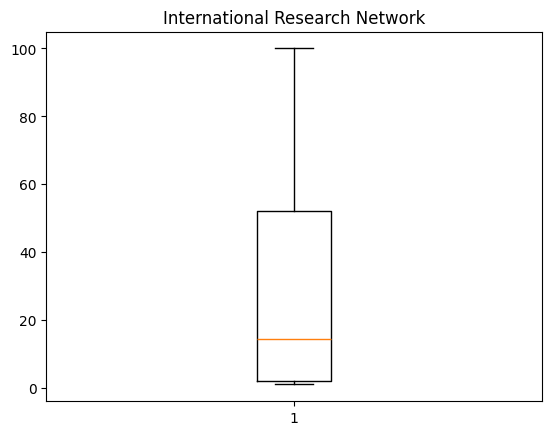

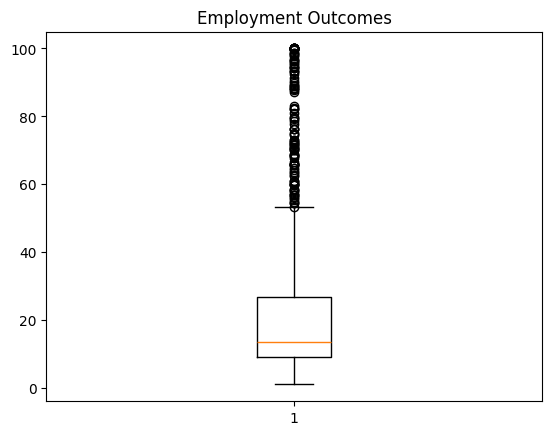

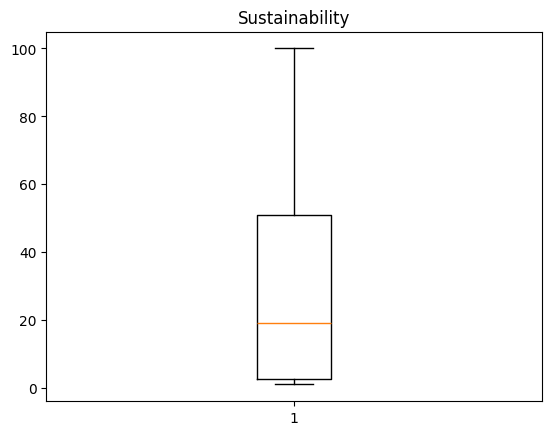

In [14]:
for column in df.columns:
    if column != 'Institution Name' and \
        column != 'Region' and \
        column != 'Country'and \
        column != 'Overall':
            plt.boxplot(df[column])
            plt.title(column)
            plt.show()

In [15]:
def reduce_noise(df: pd.DataFrame, column: str) -> pd.DataFrame:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    upper = Q3 + 1.5 * IQR
    lower = Q1 - 1.5 * IQR

    upper_array = np.where(df[column] >= upper)[0]
    lower_array = np.where(df[column] <= lower)[0]

    mean = np.median(df[column])

    for index in upper_array:
        df.at[index,column] = mean
    
    for index in lower_array:
        df.at[index,column] = mean 

    return df 

df = reduce_noise(df, 'Academic Reputation')
df = reduce_noise(df, 'Employer Reputation')
df = reduce_noise(df, 'Employment Outcomes')

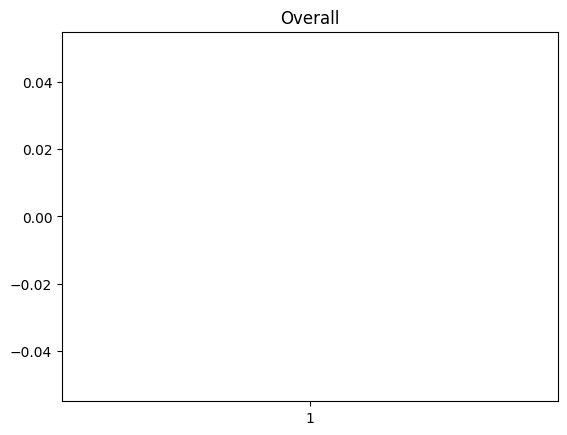

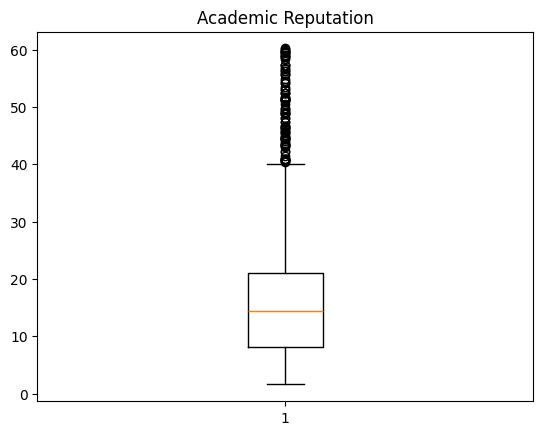

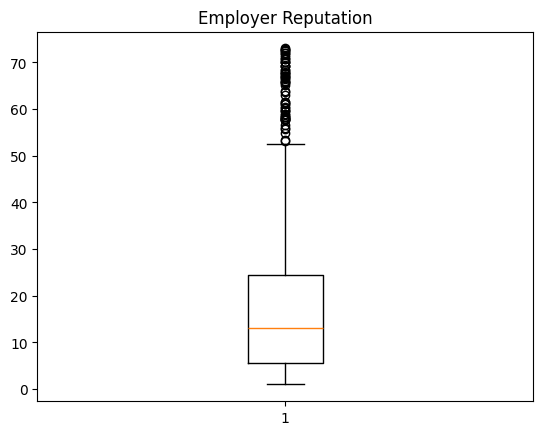

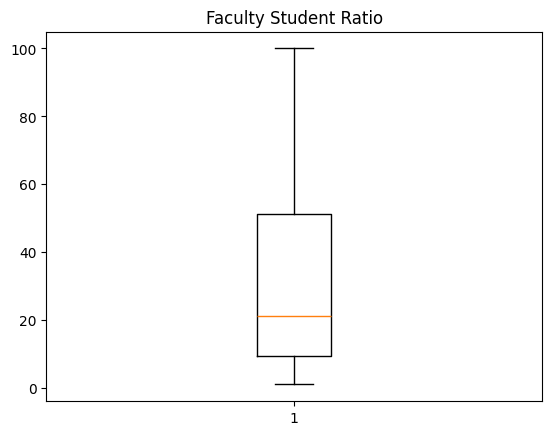

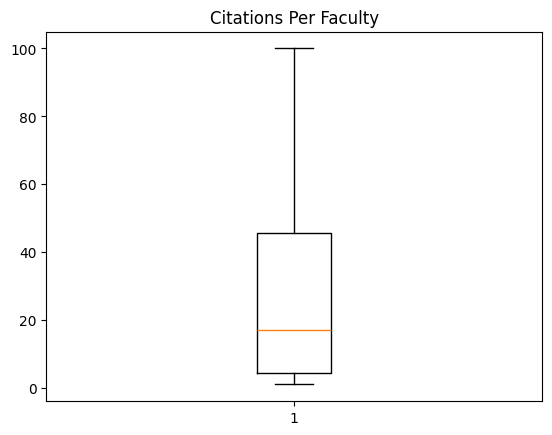

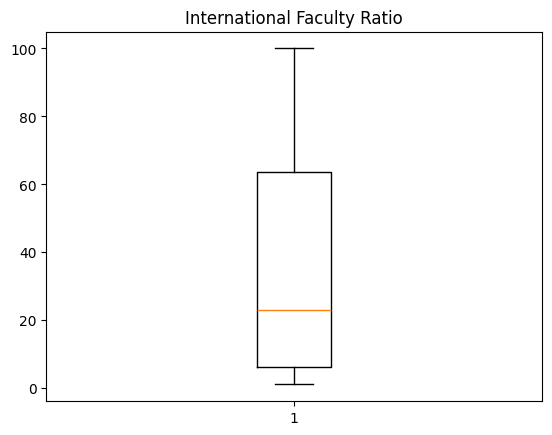

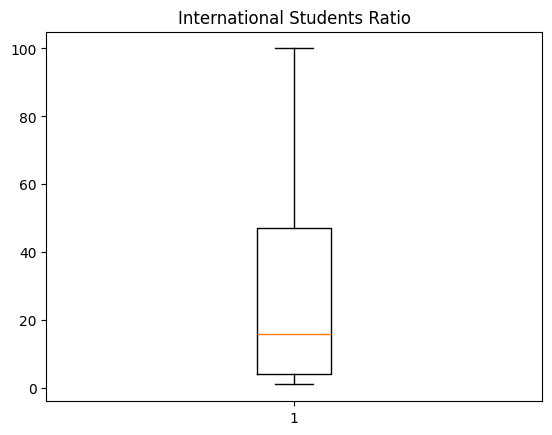

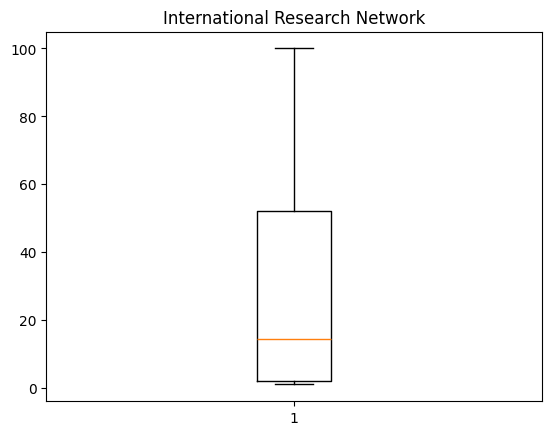

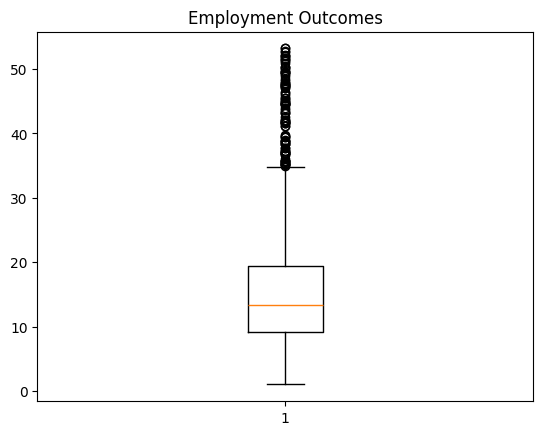

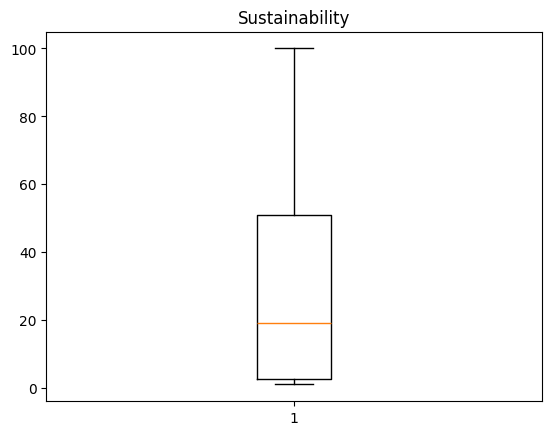

In [16]:
for column in df.columns:
    if column != 'Institution Name' and \
        column != 'Region' and \
        column != 'Country':
            plt.boxplot(df[column])
            plt.title(column)
            plt.show()

In [17]:
# Xem xét xem có nên lưu dữ liệu này hay không
"""
file_path ='../Data/processed/universities_reducenoise.csv'

df.to_csv(file_path, index=False)
"""

"\nfile_path ='../Data/processed/universities_reducenoise.csv'\n\ndf.to_csv(file_path, index=False)\n"